# Imports

In [68]:
import os
import pickle
import pprint

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from openretina.dataloaders import (
    MovieDataSet,
    MovieSampler,
)
from openretina.misc import CustomPrettyPrinter
from openretina.plotting import (
    play_sample_batch,
    play_stimulus,
    undo_video_normalization,
)
from openretina.stimuli import load_chirp, load_moving_bar, load_moving_bar_stack

%load_ext autoreload
%autoreload 2

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [69]:
DATA_FOLDER = "/Data/fd_export"

In [70]:
!ls $DATA_FOLDER

2024-01-11_movies_dict_8c18928.pkl
2024-01-11_movies_dict_c285329.pkl
2024-01-11_neuron_data_stim_8c18928_responses_99c71a0.pkl
2024-01-11_neuron_data_stim_c285329_responses_0698360.pkl
2024-01-11_neuron_data_stim_c285329_responses_483c12d.pkl
2024-03-22_neuron_data_stim_c285329_responses_483c12d.h5
2024-03-25_neuron_data_responses_484c12d_djimaging.h5
2024-03-27_neuron_data_stim_c285329_responses_483c12d.h5
2024-03-28_neuron_data_responses_484c12d_djimaging.h5
RGC_Chirp_30Hz_18_16.pickle
RGC_MovingBar_30Hz_18_16.pickle
figures
models
movies_8c18928.pkl
movies_c285329.pkl


# Visualising stimuli

In [71]:
mb_raw = load_moving_bar()
print(f"{mb_raw.shape=}")
mb_stimulus = torch.Tensor(mb_raw.transpose(3, 0, 1, 2))
print(f"{mb_stimulus.shape=}")

mb_raw.shape=(1104, 18, 16, 2)
mb_stimulus.shape=torch.Size([2, 1104, 18, 16])


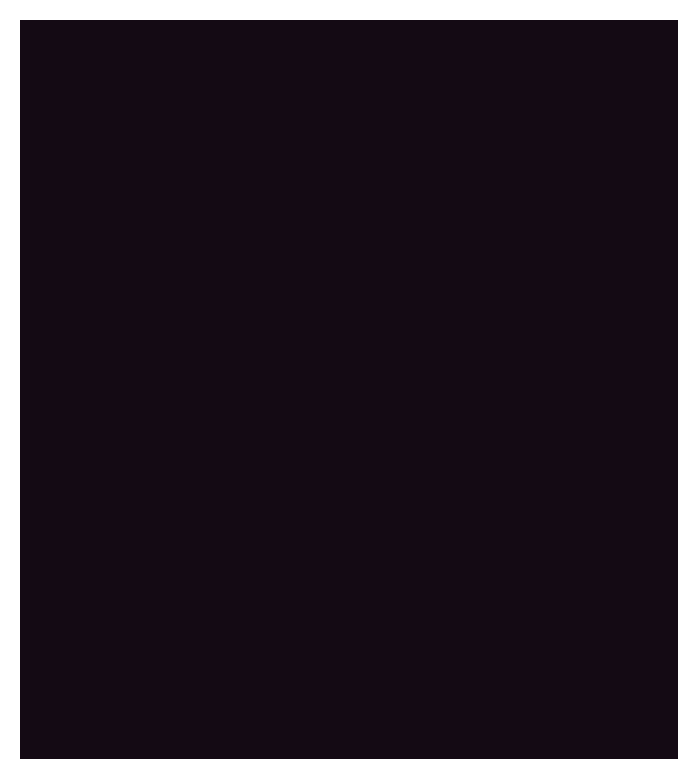

In [72]:
play_stimulus(mb_stimulus)

In [74]:
mb_stack = load_moving_bar_stack()
mb_stack = torch.tensor(mb_stack.transpose(0, 4, 1, 2, 3))

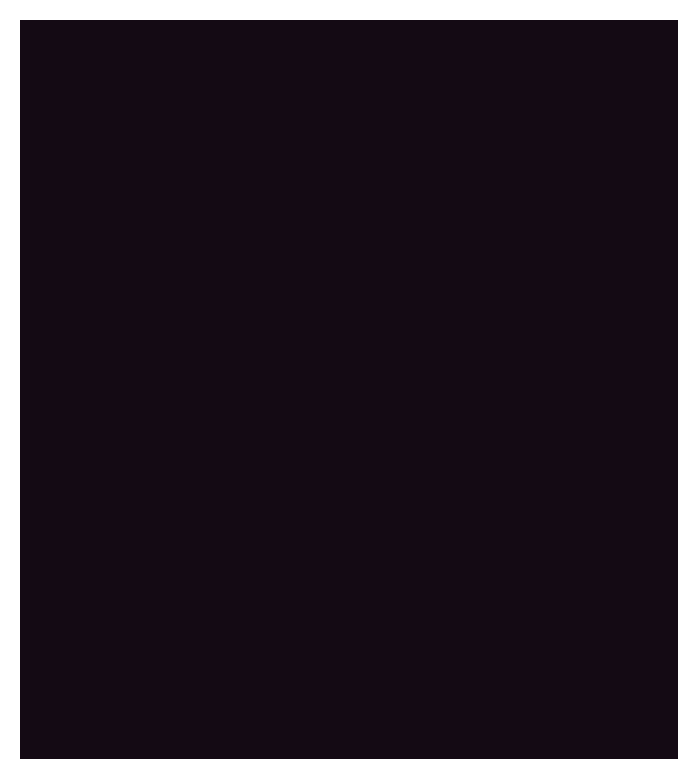

In [76]:
play_stimulus(mb_stack[0])

In [77]:
raw_chirp = load_chirp()
print(f"{raw_chirp.shape=}")
chirp_stimulus = torch.Tensor(raw_chirp.transpose(3, 0, 1, 2))
print(f"{chirp_stimulus.shape=}")

raw_chirp.shape=(990, 18, 16, 2)
chirp_stimulus.shape=torch.Size([2, 990, 18, 16])


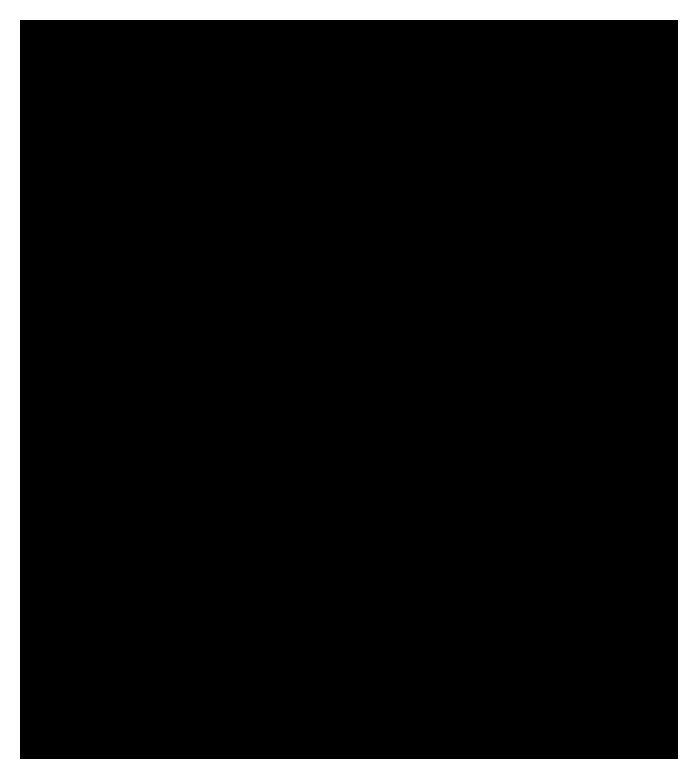

In [78]:
play_stimulus(chirp_stimulus)

In [79]:
movies_path = os.path.join(DATA_FOLDER, "2024-01-11_movies_dict_8c18928.pkl")
movies_dict = pickle.load(open(movies_path, "rb"))

In [80]:
test_movie = movies_dict["test"]

In [81]:
test_movie.shape

(2, 750, 18, 16)

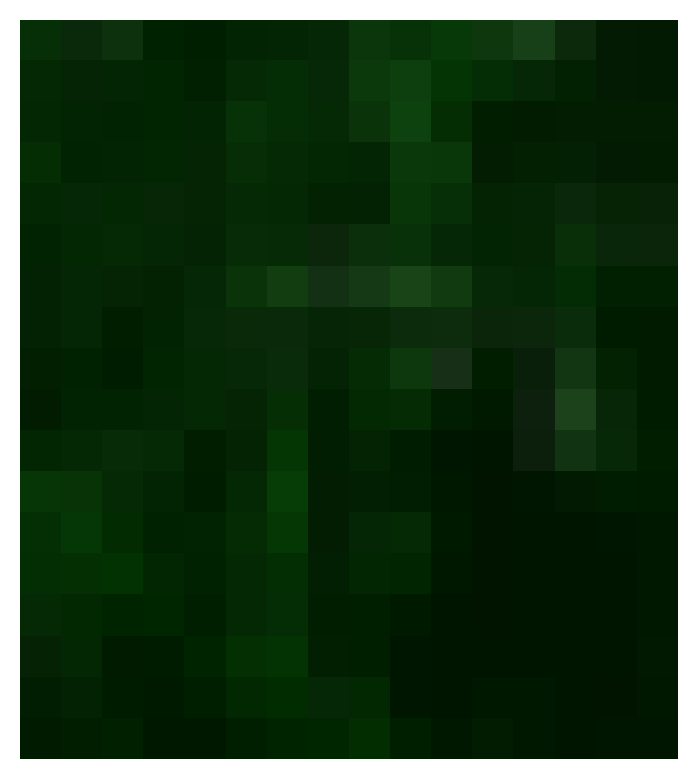

In [84]:
play_stimulus(undo_video_normalization(torch.tensor(test_movie)))

---

# Testing alignment with responses

In [85]:
from openretina.h5_handling import load_h5_into_dict
from openretina.neuron_data_io import make_final_responses

data_path = os.path.join(DATA_FOLDER, "2024-03-28_neuron_data_responses_484c12d_djimaging.h5")
movies_path = os.path.join(DATA_FOLDER, "2024-01-11_movies_dict_8c18928.pkl")
responses = load_h5_into_dict(data_path)

Loading HDF5 file contents:   0%|          | 0/1474 [00:00<?, ?item/s]

In [86]:
stim_dataloaders_dict = make_final_responses(responses, response_type="natural")
movies_dict = pickle.load(open(movies_path, "rb"))

Upsampling natural traces to get final responses.:   0%|          | 0/67 [00:00<?, ?it/s]

In [87]:
test_session = "session_1_ventral1_20200226"

In [88]:
stim_dataloaders_dict.keys()

dict_keys(['session_1_ventral1_20200226', 'session_1_ventral1_20200528', 'session_1_ventral1_20200707', 'session_1_ventral1_20201021', 'session_1_ventral1_20201030', 'session_1_ventral1_20210929', 'session_1_ventral1_20210930', 'session_1_ventral2_20200302', 'session_1_ventral2_20200707', 'session_1_ventral2_20201021', 'session_1_ventral2_20201022', 'session_1_ventral2_20201030', 'session_1_ventral2_20201117', 'session_1_ventral2_20210910', 'session_1_ventral2_20210921', 'session_1_ventral2_20210929', 'session_1_ventral2_20210930', 'session_1_ventral2_20211130', 'session_2_ventral1_20200226', 'session_2_ventral1_20200303', 'session_2_ventral1_20200528', 'session_2_ventral1_20200529', 'session_2_ventral1_20200701', 'session_2_ventral1_20201021', 'session_2_ventral1_20201030', 'session_2_ventral1_20210929', 'session_2_ventral2_20200303', 'session_2_ventral2_20201016', 'session_2_ventral2_20201021', 'session_2_ventral2_20201022', 'session_2_ventral2_20201030', 'session_2_ventral2_20201117

In [89]:
stim_dataloaders_dict = make_final_responses(responses, response_type="chirp")

Upsampling chirp traces to get final responses.:   0%|          | 0/67 [00:00<?, ?it/s]

/Projects/open-retina/openretina/neuron_data_io.py:482: UserWarning: You seem to already have computed `responses_final` for a stim_id of 5. Overwriting with 1 (chirp).
  f"You seem to already have computed `responses_final` for a stim_id of {data_dict[field]['stim_id']}. Overwriting with {stim_id} ({response_type})."


In [ ]:
stim_dataloaders_dict[test_session]["chirp_responses_final"].shape

(131, 4950)

In [ ]:
chirp_stimulus.shape[1] * 5

4950

In [ ]:
# Done with the chirp

---

In [92]:
stim_dataloaders_dict = make_final_responses(responses, response_type="mb")

Upsampling mb traces to get final responses.:   0%|          | 0/67 [00:00<?, ?it/s]

/Projects/open-retina/openretina/neuron_data_io.py:482: UserWarning: You seem to already have computed `responses_final` for a stim_id of 1. Overwriting with 2 (mb).
  f"You seem to already have computed `responses_final` for a stim_id of {data_dict[field]['stim_id']}. Overwriting with {stim_id} ({response_type})."


In [93]:
stim_dataloaders_dict[test_session]["mb_responses_final"].shape

(131, 2928)

In [96]:
stim_dataloaders_dict[test_session]["mb_responses_final"].shape[1] / 3

976.0

In [95]:
mb_stimulus[:, 90:-30].shape

torch.Size([2, 984, 18, 16])

In [ ]:
# 8 frame discrepancy between the stimulus and the response. That is one frame per bar.